In [9]:
import os
import json
import matplotlib.pyplot as plt

dataset_root_dir = '/data4/dataSpace/EGO_EXO4D/'
captures = json.load(open(os.path.join(dataset_root_dir, 'captures.json')))
takes = json.load(open(os.path.join(dataset_root_dir, 'takes.json')))
len(takes)

5035

In [10]:
# take_uid = "cb4a441d-0dae-4bec-90e3-1b9dab39e269" #Basketball
take_uid = "fad811da-e457-4d2a-8cf4-c3a09c11a41a"  # Dance
take_idx = [i for i, take in enumerate(takes) if take['take_uid'] == take_uid][0]

In [11]:
import glob
import numpy as np

dir = '/data4/dataSpace/EGO_EXO4D/preprocessed'
mocap_dir = f'{dir}/motion_capture/3D/train/'
imu_dir = f'{dir}/imu_right_200hz'

i = take_idx
take = takes[i]

fn = np.load(f'{mocap_dir}/{i:04}_frame_number.npy')
mocap = np.load(f'{mocap_dir}/{i:04}_motion_capture.npy')

imu = np.load(f'{imu_dir}/{i:04}_imu.npy')

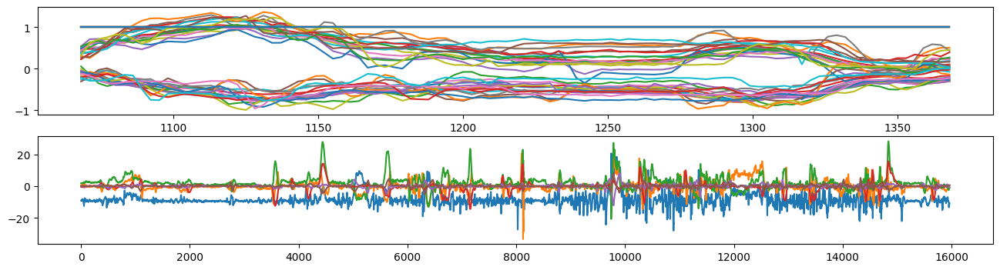

In [12]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(16, 4))

fig.add_subplot(2, 1, 1)
plt.plot(fn, mocap.T)

fig.add_subplot(2, 1, 2)
plt.plot(imu)

plt.show()

In [13]:
mocap.shape, imu.shape

((51, 98), (15966, 6))

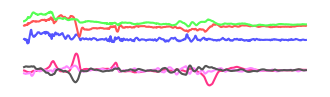

In [30]:
FPS = 30
HZ = 200

mocap_start_fn, mocap_end_fn = 113, 393
converted_imu_start_idx = int((mocap_start_fn/FPS)*HZ)
converted_imu_end_idx = int((mocap_end_fn/FPS)*HZ)+10

import matplotlib.pyplot as plt
fig = plt.figure(figsize=(4, 1))
fig.add_subplot(2,1,1)
plt.plot(imu[converted_imu_start_idx:converted_imu_end_idx, 0], label='x', c='#55f')
plt.plot(imu[converted_imu_start_idx:converted_imu_end_idx, 1], label='y', c='#f55')
plt.plot(imu[converted_imu_start_idx:converted_imu_end_idx, 2], label='z', c='#5f5')
plt.axis('off')
fig.add_subplot(2,1,2)
plt.plot(imu[converted_imu_start_idx:converted_imu_end_idx, 3], label='gyrx', c='#f38')
plt.plot(imu[converted_imu_start_idx:converted_imu_end_idx, 4], label='gyry', c='#f8f')
plt.plot(imu[converted_imu_start_idx:converted_imu_end_idx, 5], label='gyrz', c='#555')
plt.axis('off')

plt.savefig('_.png')
plt.show()

In [15]:
comments_json = json.load(open(os.path.join(dataset_root_dir, 'annotations/expert_commentary_train.json')))

In [16]:
comments = comments_json['annotations'][take_uid][0]['commentary_data']
texts = {f'{i}.webm':'' for i in range(len(comments))}
for i in range(len(comments)):
    texts[comments[i]['recording']]= comments[i]['text']

In [17]:
texts

{'0.webm': " The dancer does a good job of really creating a straight line with her arm here. It would be even better if she brought her arm backwards a little bit in space so that it was directly up, especially since we're looking at it from the audience view, which is from her back. So her hand is a bit up, but in front of her, and it would be better if it was directly up, more that it was in line with her shoulder blade, pointed straight upward instead of upward and forward on a diagonal.",
 '1.webm': " The dancer's back leg or her left leg is turned in here. Really her leg should be facing a bit more to the side. Her leg should be pointing directly to what is the dancer's left side of the room or our right side of the screen. Because this way her leg would be tracking or her knees would be tracking over her toes. Here her legs are twisted a bit too further or a bit too far.",
 '2.webm': " The dancer's wrist is bent at an angle and her fingers are very stiff. It would be better if h

In [18]:
len(comments_json['annotations'])

1831

In [25]:
take['task_name']

'LosAndes_Advanced_Salsa'

In [67]:
comments_train_json = json.load(open(os.path.join(dataset_root_dir, 'annotations/expert_commentary_train.json')))['annotations']
comments_val_json = json.load(open(os.path.join(dataset_root_dir, 'annotations/expert_commentary_val.json')))['annotations']

comments_val_json

{'96e117f2-984a-42fe-ad83-23857e27ae45': [{'take_name': 'georgiatech_bike_06_4',
   'take_uid': '96e117f2-984a-42fe-ad83-23857e27ae45',
   'task_id': 4003,
   'task_name': 'Fix a Flat Tire - Replace a Bike Tube',
   'commentary': 'georgiatech_bike_06_4/qfbn5o',
   'commentary_data': [{'recording': '10.webm',
     'video_time': 128.139543,
     'text': ' The mechanic is pulling one bead to the side of the tire so they can install the valve stem into the valve hole of the wheel. This is a good practice because then they can work the rest of the tube shown here into the tire by hand without any trouble.',
     'error': False,
     'duration_approx': 21.77940000000596},
    {'recording': '14.webm',
     'video_time': 209.721611,
     'text': ' When using a compressor or a pump to inflate the tire, sometimes the valve will not want to stay seated in its position and it will not give a secure fit for the pump. A way to help this is to hold on to the tire and tube at the valve stem, just to h

In [73]:
task = take['task_name']

i = 8
comment = comments[i]
print(comment['recording'][:-5])
print(comment['video_time'])
text = f"The following text was annotated by an expert after watching the video from the start of task '{task}' up to {comment['video_time']} seconds: {comment['text']}"

HZ = 200
IMU_LENGTH= 1000
imu_end_idx = int(comment['video_time']*HZ)+1
if imu_end_idx - IMU_LENGTH > 0:
    imu_window = imu[imu_end_idx-IMU_LENGTH:imu_end_idx]
imu_window.shape

17
58.454934


(1000, 6)

## datasets

In [6]:
import glob
import numpy as np
from torch.utils.data import Dataset, DataLoader

class DataSet(Dataset):
    def __init__(self, path='/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/', transform=None):
        self.transform = transform

        self.mocap_files = glob.glob(f'{path}*_mocap.npy')
        self.imu_files = glob.glob(f'{path}*_imu.npy')
    def __len__(self):
        return len(self.mocap_files)
    def __getitem__(self, idx):
        mocap = np.load(self.mocap_files[idx]).astype(np.float32)
        imu = np.load(self.imu_files[idx]).astype(np.float32)

        if self.transform is not None:
            mocap = self.transform(mocap)
            imu = self.transform(imu)
        
        return mocap, imu

In [9]:
from torchvision import transforms
transform = transforms.Compose([transforms.Normalize(mean=0., std=1., inplace=True)])
d = DataSet(transform=transform)
d = DataSet()
print(len(d))

1966


In [10]:
loader = DataLoader(d, batch_size=16, num_workers=5)
for mocap, imu in loader:
    print(mocap.shape, imu.shape)
    break

torch.Size([16, 51, 50]) torch.Size([16, 6, 1000])


In [4]:
import numpy as np
a = np.loadtxt('/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/100ms_datafiles/test_files.txt', dtype=str)
len(a)

17209

## timesync

In [57]:
import pandas as pd
def get_timesync(take):
    cid = [i for i, capture in enumerate(captures) if capture['capture_uid'] == take['capture_uid']][0]
    path = os.path.join(dataset_root_dir, f"captures/{captures[cid]['capture_name']}/timesync.csv")
    timesync = pd.read_csv(path)

    timesync_start = timesync.iloc[take["timesync_start_idx"]+1]
    timesync_end   = timesync.iloc[take["timesync_end_idx"]-1]

    start_ts = timesync_start['aria01_214-1_capture_timestamp_ns']
    end_ts   = timesync_end['aria01_214-1_capture_timestamp_ns']
    start_fn = timesync_start['aria01_214-1_frame_number']
    end_fn   = timesync_end['aria01_214-1_frame_number']
    return {
        start_ts: start_fn,
        end_ts: end_fn
    }

In [63]:
take = takes[i]
cid = [i for i, capture in enumerate(captures) if capture['capture_uid'] == take['capture_uid']][0]
path = os.path.join(dataset_root_dir, f"captures/{captures[cid]['capture_name']}/timesync.csv")
timesync = pd.read_csv(path)

timesync_start = timesync.iloc[take["timesync_start_idx"]+1]
timesync_end   = timesync.iloc[take["timesync_end_idx"]-1]

start_ts = timesync_start['aria01_214-1_capture_timestamp_ns']
end_ts   = timesync_end['aria01_214-1_capture_timestamp_ns']
start_fn = timesync_start['cam01_frame_number']
end_fn   = timesync_end['cam01_frame_number']
start_ts, end_ts, start_fn, end_fn

(528984102137.0, 684392564387.0, 19377.0, 28694.0)

In [1]:
import torch
from torchvision import transforms
from lib.dataloader import ImuMocapDataset, worker_init_fn
from tqdm.notebook import tqdm

transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize(mean=0., std=1., inplace=True)])
dataset = ImuMocapDataset(transform=transform)

for i in tqdm(range(len(dataset))):
    x = dataset[i]
    imu, mocap = x['imu'], x['mocap']
    if torch.isnan(mocap).any():
        print(i, mocap)
        break

  0%|          | 0/1963 [00:00<?, ?it/s]

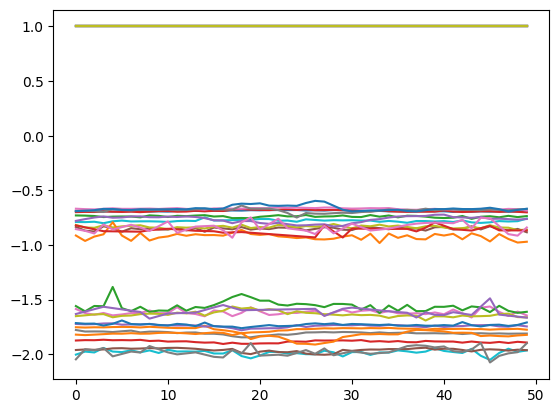

In [5]:
import matplotlib.pyplot as plt

plt.plot(mocap.numpy().T)
plt.show()

In [18]:
for p in range(51):
    if torch.isnan(mocap[p]).any():
        print(p)


39
40
41
42
43
44
45
46
47
48
49
50


In [ ]:
import torch
##############
# Set up meta
##############
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'

##############
# Set up data
##############
from torch.utils.data import DataLoader
from torchvision import transforms
from lib.dataloader import ImuMocapDataset, worker_init_fn

transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize(mean=0., std=1., inplace=True)])
dataset = ImuMocapDataset(transform=transform)
loader = DataLoader(
    dataset,
    batch_size=16,
    num_workers=4,
    worker_init_fn=worker_init_fn,
    shuffle=True,
    pin_memory=True,
)

###############
# Set up model
###############
from lib.models import MW2StackRNNPooling, MW2StackRNNPoolingMocap, ImuMocapContrastiveLearningModule
size_embedding = 512
imu_encoder = MW2StackRNNPooling(size_embeddings=size_embedding)
mocap_encoder = MW2StackRNNPoolingMocap(size_embeddings=size_embedding)
model = ImuMocapContrastiveLearningModule(imu_encoder, mocap_encoder)

##################
# Set up training
##################
from lib.loss import InfoNCE
loss_fn = InfoNCE(symmetric_loss=True, learn_temperature=True)
optimizer = torch.optim.AdamW(model.parameters(), lr=5e-4, weight_decay=1e-5, amsgrad=True)

model.to(device)
model.train()
epochs = 100
for epoch in range(epochs):
    running_loss = 0.0
    for i, x in enumerate(loader):
        x_imu = x['imu'].to(device)
        x_mocap = x['mocap'].to(device)
        imu_features, mocap_features = model(x_imu, x_mocap)

        loss = loss_fn(imu_features, mocap_features)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

In [ ]:
import torch
from lib.models import MW2StackRNNPooling, MW2StackRNNPoolingMocap

imu_encoder   = MW2StackRNNPooling(size_embeddings=512)
mocap_encoder = MW2StackRNNPoolingMocap(size_embeddings=512)

imu_length = 1000
x_imu = torch.tensor(imu.transpose(1, 0))
x_imu = torch.stack(x_imu.split(imu_length, dim=1)[:-1])
x_imu = x_imu.to(dtype=torch.float)
out_imu = imu_encoder(x_imu)

mocap_length = 50 # おそらく10Hzだろうということで5s間の50
x_mocap = torch.randn(1, 51, mocap_length)
out_mocap = mocap_encoder(x_mocap)

In [5]:
import torch
import lib.transformer as Ts

imu_encoder = Ts.__dict__['SS'](window_size=1000, in_chans=6, patch_size=4)
x_imu = torch.randn(16, 6, 1000)
imu_features = imu_encoder(x_imu)

mocap_encoder = Ts.__dict__['SS'](window_size=50, in_chans=51, patch_size=2)
x_mocap = torch.randn(16, 51, 50)
mocap_features = mocap_encoder(x_mocap)

imu_features.shape, mocap_features.shape


(torch.Size([16, 192]), torch.Size([16, 192]))

In [76]:
import torch
from torch import nn
from lib.models import Block

class MW2StackRNNPoolingMocapFor100ms(nn.Module):
    def __init__(self, input_dim=128, size_embeddings: int = 128):
        super().__init__()
        self.name = MW2StackRNNPoolingMocap
        n_joints = 17
        channels = n_joints*3
        self.net = torch.nn.Sequential(
            torch.nn.GroupNorm(n_joints, channels),
            Block(channels, input_dim, 1, pooling_ks=1, dilation=1),
            Block(input_dim, input_dim, 1, pooling_ks=1, dilation=1),
            Block(input_dim, input_dim, 1, pooling_ks=1, dilation=1),
            Block(input_dim, input_dim, 1, pooling_ks=1, dilation=1),
            Block(input_dim, input_dim, 1, pooling_ks=1, dilation=1),
            torch.nn.GroupNorm(4, input_dim),
            torch.nn.GRU(batch_first=True, input_size=1, hidden_size=size_embeddings),
        )
    def forward(self, batch):
        # return the last hidden state
        return self.net(batch)[1][0]
model = MW2StackRNNPoolingMocapFor100ms(size_embeddings=128)
x = torch.randn(1, 51, 1)
model(x).shape

torch.Size([1, 128])

In [73]:
input_dim =64
size_embeddings = 128

x = torch.randn(1, 51, 1)
print(x.shape)
x = torch.nn.GroupNorm(17, 51)(x)
print(x.shape)
x = Block(51, input_dim, 1, pooling_ks=1, dilation=1)(x)
print(x.shape)
x = Block(input_dim, input_dim, 1, pooling_ks=1, dilation=1)(x)
print(x.shape)
# x = Block(input_dim, input_dim, 2, pooling_ks=1)(x)
# print(x.shape)
# x = torch.nn.GroupNorm(4, input_dim)(x)
# print(x.shape)
# x = torch.nn.GRU(batch_first=True, input_size=input_dim, hidden_size=size_embeddings)(x)
# print(x.shape)

torch.Size([1, 51, 1])
torch.Size([1, 51, 1])
torch.Size([1, 64, 1])
torch.Size([1, 64, 1])


In [6]:
import glob
imu_files = glob.glob('/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/100ms/*_imu.npy')
mocap_files = glob.glob('/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/100ms/*_mocap.npy')
imu_files.sort()
mocap_files.sort()
len(imu_files), len(mocap_files)

(172082, 172082)

In [7]:
from sklearn.model_selection import train_test_split

# _, imu_files = train_test_split(imu_files, test_size=0.1, shuffle=True, random_state=0)
val_test_size = 4000
imu_files_train_, imu_files_test = train_test_split(imu_files, test_size=val_test_size, shuffle=True, random_state=0)
imu_files_train, imu_files_val = train_test_split(imu_files_train_, test_size=val_test_size, shuffle=True, random_state=0)
len(imu_files_train), len(imu_files_val), len(imu_files_test)

(164082, 4000, 4000)

In [8]:
def save_file_path(files, name):
    path = f'/home/ukita/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/100ms_datafiles/{name}_files.txt'
    with open(path, 'w') as f:
        for i in files:
            f.write(f'/home/ukita{i[:-8]}\n')

save_file_path(imu_files_train, 'train')
save_file_path(imu_files_val, 'val')
save_file_path(imu_files_test, 'test')

In [43]:
import numpy as np
path = '/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/test_files.txt'
files = sorted(np.loadtxt(path, dtype=str))
len(files)
[file+'_imu.npy' for file in files]

240

In [108]:
imu_files

['/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/i-t/0000_02_imu.npy',
 '/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/i-t/0000_03_imu.npy',
 '/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/i-t/0000_04_imu.npy',
 '/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/i-t/0000_05_imu.npy',
 '/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/i-t/0000_06_imu.npy',
 '/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/i-t/0000_07_imu.npy',
 '/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/i-t/0000_08_imu.npy',
 '/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/i-t/0000_09_imu.npy',
 '/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/i-t/0000_10_imu.npy',
 '/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/i-t/0000_11_imu.npy',
 '/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/i-t/0001_00_imu.npy',
 '/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/i-t/0001_01_imu.npy',
 '/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/i-t/0001_02_imu.npy',
 '/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/

In [109]:
from sklearn.model_selection import train_test_split

# _, imu_files = train_test_split(imu_files, test_size=0.1, shuffle=True, random_state=0)
val_test_size = 1000
imu_files_train_, imu_files_test = train_test_split(imu_files, test_size=val_test_size, shuffle=True, random_state=0)
imu_files_train, imu_files_val = train_test_split(imu_files_train_, test_size=val_test_size, shuffle=True, random_state=0)
len(imu_files_train), len(imu_files_val), len(imu_files_test)

(16986, 1000, 1000)

In [112]:
def save_file_path(files, name):
    path = f'/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/i-t_datafiles'
    os.makedirs(path, exist_ok=True)
    with open(f'{path}/{name}_files.txt', 'w') as f:
        for i in files:
            f.write(f'{i[:-8]}\n')

save_file_path(imu_files_train, 'train')
save_file_path(imu_files_val, 'val')
save_file_path(imu_files_test, 'test')

In [101]:
import glob
import numpy as np
def load_text(path):
    with open(path, 'r') as f:
        text = f.read()
    return text

path = '/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/i-t'
imu_files = sorted(glob.glob(f'{path}/*imu.npy'))
text_files = sorted(glob.glob(f'{path}/*text.txt'))
# len(imu_files), len(text_files)

idx = 6
imu = np.load(imu_files[idx]).astype(np.float32)
text = load_text(text_files[idx])

In [121]:
path = '/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/i-t'
imu_files = sorted(glob.glob(f'{path}/*imu.npy'))

for imu_file in imu_files:
    imu = np.load(imu_file).astype(np.float32)
    if imu.shape != (1000, 6):
        print(imu.shape)

In [1]:
data_path = '/home/ukita/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/i-t_datafiles'
batch_size = 1
num_workers = 1
device = 'cuda:0'

from torch.utils.data import DataLoader
from torchvision import transforms
from lib.dataloader import ImuTextDataset, worker_init_fn
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize(mean=0., std=1., inplace=True)])

train_dataset = ImuTextDataset(path=data_path, name='train', transform=transform)
train_loader = DataLoader(train_dataset, batch_size=batch_size, num_workers=num_workers, worker_init_fn=worker_init_fn, shuffle=True, pin_memory=True)

val_dataset = ImuTextDataset(path=data_path, name='val', transform=transform)
val_loader = DataLoader(val_dataset, batch_size=batch_size, num_workers=num_workers, worker_init_fn=worker_init_fn, shuffle=False, pin_memory=True)


from lib.models import MW2StackRNNPooling
imu_encoder = MW2StackRNNPooling(size_embeddings=512)
import lib.transformer as Ts
# imu_encoder = Ts.__dict__[args.model_size](window_size=1000, in_chans=6, patch_size=args.patch_size)
from lib.clip_model import ClipPLModel
from lib.models import ImuTextContrastiveLearningModule
text_encoder = ClipPLModel(freeze=True, device=device)
model = ImuTextContrastiveLearningModule(imu_encoder, text_encoder).to(device)

Loading clip model ...


In [ ]:
for x in train_loader:
    x_imu = x['imu'].to(device)
    x_text = x['text']
    imu_features, text_features = model(x_imu, x_text)

In [2]:
import torch
state_dict = torch.load('/home/ukita/human-activity-recognition/imuclip/imu2clip/saved/egohos_best.pt')

/tmp/ipykernel_2021561/1033678206.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load('/home/ukita/human-activity-recognition/imuclip/imu2clip/saved/

In [10]:
data_path = '/home/ukita/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/i-t_datafiles'
batch_size = 256
num_workers = 1
device = 'cuda:0'

from torch.utils.data import DataLoader
from torchvision import transforms
from lib.dataloader import ImuTextDataset, worker_init_fn
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize(mean=0., std=1., inplace=True)])
test_dataset = ImuTextDataset(path=data_path, name='test', transform=transform)
test_loader = DataLoader(test_dataset, batch_size=batch_size, num_workers=num_workers, worker_init_fn=worker_init_fn, shuffle=False, pin_memory=True)

from lib.models import MW2StackRNNPooling
imu_encoder = MW2StackRNNPooling(size_embeddings=512)
from lib.clip_model import ClipPLModel
from lib.models import ImuTextContrastiveLearningModule
text_encoder = ClipPLModel(freeze=True, device=device).to(dtype=torch.float)
model = ImuTextContrastiveLearningModule(imu_encoder, text_encoder).to(device)
model.load_state_dict(state_dict, strict=False)

model.eval()

from lib.evaluation import evaluate
metrics = evaluate(test_loader, model, result_path='/home/ukita/human-activity-recognition/imuclip/imu2clip/saved', device=device)
print(metrics)

Loading clip model ...
{'s_t_metrics': {'MRR': 0.009594571776688099, 'R@1': 0.0010000000474974513, 'R@10': 0.014999999664723873, 'R@50': 0.07199999690055847}, 't_s_metrics': {'MRR': 0.009394715540111065, 'R@1': 0.0020000000949949026, 'R@10': 0.009999999776482582, 'R@50': 0.07800000160932541}, 'num_candidates': 1000}


In [4]:
tasks = {}
for take in takes:
    task = take['task_name']
    if not task in tasks.keys():
        tasks[task] = 0

In [7]:
tasks

{'Remove a Wheel': 0,
 'Fix a Flat Tire - Replace a Bike Tube': 0,
 'Install a Wheel': 0,
 'Clean and Lubricate the Chain': 0,
 'Soccer Drills - Inside Trap and Outside Play': 0,
 'Soccer Drills - Outside Trap and Outside Play': 0,
 'Soccer Drills - Dribbling': 0,
 'Soccer Drills - Juggling': 0,
 'Soccer Drills - Penalty Kick': 0,
 'Adjust a Rear Derailueur': 0,
 'Cooking Noodles': 0,
 'Making Sesame-Ginger Asian Salad': 0,
 'Cooking Tomato & Eggs': 0,
 'Covid-19 Rapid Antigen Test': 0,
 'Cooking an Omelet': 0,
 'Making Cucumber & Tomato Salad': 0,
 'Making Milk Tea': 0,
 'Playing Guitar - Suzuki Books': 0,
 'Playing Guitar': 0,
 'Playing Guitar - Scales and Arpeggios': 0,
 'Playing Piano - Freeplaying': 0,
 'Playing Piano - Scales and Arpeggios': 0,
 'Cooking Scrambled Eggs': 0,
 'Cooking Sushi Rolls': 0,
 'Cooking Brownies': 0,
 'Making Chai Tea': 0,
 'Playing Violin - Scales and Arpeggios': 0,
 'Playing Violin - Suzuki Books': 0,
 'Playing Violin - Freeplaying': 0,
 'Playing Piano -

## downstream

In [4]:
import os
import json
import matplotlib.pyplot as plt

dataset_root_dir = '/data4/dataSpace/EGO_EXO4D/'
captures = json.load(open(os.path.join(dataset_root_dir, 'captures.json')))
takes = json.load(open(os.path.join(dataset_root_dir, 'takes.json')))
keystep = json.load(open(os.path.join(dataset_root_dir, 'annotations/keystep_train.json')))
len(takes)

5035

In [5]:
takes[0]['take_uid']

'ed3ec638-8363-4e1d-9851-c7936cbfad8c'

In [7]:
keystep.keys()

dict_keys(['taxonomy', 'vocabulary', 'ds', 'annotations'])

In [ ]:
label_dict = {}
for i, key in enumerate(keystep['taxonomy'].keys()):
    label_dict[key] =  i

In [16]:
label_dict

{'Covid-19 Rapid Antigen Test': 0,
 'Fix a Flat Tire - Replace a Bike Tube': 1,
 'Remove a Wheel': 2,
 'Install a Wheel': 3,
 'Clean and Lubricate the Chain': 4,
 'First Aid - CPR': 5,
 'Making Coffee latte': 6,
 'Making Cucumber & Tomato Salad': 7,
 'Cooking Scrambled Eggs': 8,
 'Cooking an Omelet': 9,
 'Making Milk Tea': 10,
 'Making Sesame-Ginger Asian Salad': 11,
 'Cooking Tomato & Eggs': 12,
 'Making Chai Tea': 13,
 'Cooking Noodles': 14,
 'Cooking Sushi Rolls': 15,
 'Cooking Pasta': 16}

In [13]:
keystep = json.load(open(os.path.join(dataset_root_dir, 'annotations/keystep_val.json')))
len(keystep['taxonomy'].keys())

17

In [21]:
takes[0]['parent_task_name'], takes[0]['parent_task_id']

('Bike Repair', 4000)

In [27]:
dataset_root_dir = '/data4/dataSpace/EGO_EXO4D/'
takes = json.load(open(os.path.join(dataset_root_dir, 'takes.json')))

labels = {}
for take in takes:
    label_name = take['parent_task_name']
    label_id = take['parent_task_id']
    if not label_name in labels.keys():
        labels[label_name] = label_id
labels

{'Bike Repair': 4000,
 'Soccer': 8000,
 'Cooking': 1000,
 'Health': 2000,
 'Music': 5000,
 'Rock Climbing': 7000,
 'Basketball': 6000,
 'Dance': 9000}

In [28]:
for i, k in enumerate(labels.keys()):
    labels[k] = i
labels

{'Bike Repair': 0,
 'Soccer': 1,
 'Cooking': 2,
 'Health': 3,
 'Music': 4,
 'Rock Climbing': 5,
 'Basketball': 6,
 'Dance': 7}

In [25]:
labels = {}
for take in takes:
    label_name = take['task_name']
    label_id = take['task_id']
    if not label_name in labels.keys():
        labels[label_name] = label_id
labels

{'Remove a Wheel': 4001,
 'Fix a Flat Tire - Replace a Bike Tube': 4003,
 'Install a Wheel': 4002,
 'Clean and Lubricate the Chain': 4004,
 'Soccer Drills - Inside Trap and Outside Play': 8001,
 'Soccer Drills - Outside Trap and Outside Play': 8002,
 'Soccer Drills - Dribbling': 8003,
 'Soccer Drills - Juggling': 8004,
 'Soccer Drills - Penalty Kick': 8005,
 'Adjust a Rear Derailueur': 4006,
 'Cooking Noodles': 1006,
 'Making Sesame-Ginger Asian Salad': 1011,
 'Cooking Tomato & Eggs': 1003,
 'Covid-19 Rapid Antigen Test': 2001,
 'Cooking an Omelet': 1001,
 'Making Cucumber & Tomato Salad': 1010,
 'Making Milk Tea': 1015,
 'Playing Guitar - Suzuki Books': 5003,
 'Playing Guitar': 5001,
 'Playing Guitar - Scales and Arpeggios': 5002,
 'Playing Piano - Freeplaying': 5012,
 'Playing Piano - Scales and Arpeggios': 5010,
 'Cooking Scrambled Eggs': 1002,
 'Cooking Sushi Rolls': 1008,
 'Cooking Brownies': 1017,
 'Making Chai Tea': 1014,
 'Playing Violin - Scales and Arpeggios': 5006,
 'Playing

In [ ]:
import numpy as np
label_dict = {
    'Bike Repair': 0,
    'Soccer': 1,
    'Cooking': 2,
    'Health': 3,
    'Music': 4,
    'Rock Climbing': 5,
    'Basketball': 6,
    'Dance': 7
}
IMU_LENGTH = 1000

for i, take in enumerate(takes):
    label = take['parent_task_name']
    path = os.path.join(dataset_root_dir, f'preprocessed/imu_right_200hz/{i:04}_imu.npy')
    if not os.path.exists(path):
        continue
    take_imu = np.load(path)
    imus = [take_imu[j*IMU_LENGTH:j*IMU_LENGTH+IMU_LENGTH].transpose(1, 0) for j in range(len(take_imu)//IMU_LENGTH)]
    if len(imus) == 0:
        continue
    idx = np.random.randint(len(imus))
    imu = imus[idx]
    dataset = np.array((imu, label_dict[label]), dtype=object)
    np.save(os.path.join(dataset_root_dir, f'preprocessed/downstream/{i:04}_imu.npy'), dataset)

In [66]:
IMU_LENGTH = 1000
take_imu.shape

(22167, 6)

In [83]:
imus = [take_imu[i*IMU_LENGTH:i*IMU_LENGTH+IMU_LENGTH] for i in range(len(take_imu)//IMU_LENGTH)]

In [91]:
a, b = np.load('/data4/dataSpace/EGO_EXO4D/preprocessed/downstream/0000_00_imu2class.npy', allow_pickle=True)
a.shape, b

((1000, 6), 0)

In [113]:
import glob

files = glob.glob(os.path.join(dataset_root_dir, 'preprocessed/downstream/*.npy'))

In [114]:
from sklearn.model_selection import train_test_split

val_test_size = 0.1
files_train_, files_test = train_test_split(files, test_size=val_test_size, shuffle=True, random_state=0)
files_train, files_val = train_test_split(files_train_, test_size=val_test_size, shuffle=True, random_state=0)
len(files_train), len(files_val), len(files_test)

(3385, 377, 418)

In [115]:
def save_file_path(files, name):
    path = f'/data4/dataSpace/EGO_EXO4D/preprocessed/downstream/splits_files'
    os.makedirs(path, exist_ok=True)
    with open(f'{path}/{name}_files.txt', 'w') as f:
        for i in files:
            f.write(f'{i}\n')

save_file_path(files_train, 'train')
save_file_path(files_val, 'val')
save_file_path(files_test, 'test')

In [117]:
imu, label = np.load(files_train[0], allow_pickle=True)
imu.shape, label

((6, 1000), 6)

### IMU Text

In [1]:
import torch
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
###############
# Set up model
###############
ckpt_path = '/home/ukita/human-activity-recognition/imuclip/ego4d/experiment_log/pre_train_i-t/001_transformer/best_3547.pt'
import lib.transformer as Ts
from lib.clip_model import ClipPLModel
from lib.models import ImuTextContrastiveLearningModule
state_dict = torch.load(ckpt_path)
ckpt_args = state_dict['args']
ckpt_args.model_size = 'SS'
imu_encoder = Ts.__dict__[ckpt_args.model_size](window_size=1000, in_chans=6, patch_size=ckpt_args.patch_size)
imu_encoder.head = torch.nn.Linear(imu_encoder.dim, 512)

text_encoder = ClipPLModel(freeze=True, device=device).to(dtype=torch.float)
it_model = ImuTextContrastiveLearningModule(imu_encoder, text_encoder)
it_model.load_state_dict(state_dict['model'])
it_model.eval()

##############
# Set up data
##############
data_path = '/home/ukita/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/i-t_datafiles'
batch_size, num_workers = 1024, 4
from torch.utils.data import DataLoader
from torchvision import transforms
from lib.dataloader import ImuTextDataset, worker_init_fn
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize(mean=0., std=1., inplace=True)])
it_dataset = ImuTextDataset(path=data_path, name='test', transform=transform)
it_loader = DataLoader(it_dataset, batch_size=batch_size, num_workers=num_workers, worker_init_fn=worker_init_fn, shuffle=False, pin_memory=True)

/tmp/ipykernel_1485856/2497321986.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(ckpt_path)


Loading clip model ...


## IMU Mocap

In [2]:
import torch
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
###############
# Set up model
###############
ckpt_path = '/home/ukita/human-activity-recognition/imuclip/ego4d/experiment_log/pre_train/008_from_i-t_transformer/best_808.pt'
import lib.transformer as Ts
from lib.models import ImuMocapContrastiveLearningModule
state_dict = torch.load(ckpt_path)
ckpt_args = state_dict['args']
imu_encoder = Ts.__dict__['SS'](window_size=1000, in_chans=6, patch_size=8)
imu_encoder.head = torch.nn.Linear(imu_encoder.dim, 512)

mocap_encoder = Ts.__dict__['SS'](window_size=50, in_chans=51, patch_size=1)
mocap_encoder.head = torch.nn.Linear(imu_encoder.dim, 512)

im_model = ImuMocapContrastiveLearningModule(imu_encoder, mocap_encoder)
im_model.load_state_dict(state_dict['model'])
im_model.eval()

##############
# Set up data
##############
data_path = '/home/ukita/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/5s_datafiles'
batch_size, num_workers = 1024, 4
from torch.utils.data import DataLoader
from torchvision import transforms
from lib.dataloader import ImuMocapDataset, worker_init_fn
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize(mean=0., std=1., inplace=True)])
im_dataset = ImuMocapDataset(path=data_path, name='test', transform=transform, random_split=True)
im_loader = DataLoader(im_dataset, batch_size=batch_size, num_workers=num_workers, worker_init_fn=worker_init_fn, shuffle=False, pin_memory=True)

/tmp/ipykernel_1485856/1601829510.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(ckpt_path)


In [3]:
it_model.to(device)
it_model.eval()

queries, keys = [], []
for x in it_loader:
    x_imu = x['imu'].to(device)
    x_ = x['text']
    with torch.no_grad():
        imu_features, _features = it_model(x_imu, x_)
        queries.append(imu_features)
        keys.append(_features)

y_query_modality = torch.cat(queries, dim=0)
y_key_modality   = torch.cat(keys, dim=0)

In [68]:
source_embeddings = y_query_modality
target_embeddings = y_key_modality

n = source_embeddings.shape[0]
target = torch.eye(n).view(-1)
indexes = torch.arange(n).repeat(n, 1).transpose(0, 1).reshape(-1)
s = torch.nn.functional.normalize(source_embeddings, dim=1)
t = torch.nn.functional.normalize(target_embeddings, dim=1)
tt = t.transpose(0, 1)
st = s.transpose(0, 1)
bsz = 1024
batch_num = n // bsz +1
# s -> t
s_t_batch_results = []
for i in range(batch_num):
    start = i * bsz
    end = min((i + 1) * bsz, n)
    query_batch = torch.mm(s[start:end], tt)  # (bsz, m) (m, n) -> (bsz, n)
    s_t_batch_results.append(query_batch.detach().cpu())
s_t_batch_results = torch.cat(s_t_batch_results, dim=0).view(-1)  # (n,n)s

In [69]:
for imu_idx in range(1000):
    imu_index_preds = s_t_batch_results.reshape(1000, 1000)[imu_idx]
    key_pred_idx = torch.argmax(imu_index_preds).item()
    key_pred_idx_2nd = torch.argsort(imu_index_preds)[-2].item()
    if imu_idx == key_pred_idx:
        print(imu_idx)
        break

RuntimeError: shape '[1000, 1000]' is invalid for input of size 1000

In [50]:
key_pred_idx, key_pred_idx_2nd

(23, 27)

/home/ukita/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/i-t/0077_49
The following text was annotated by an expert after watching the video from the start of task 'Soccer Drills - Outside Trap and Outside Play' up to 144.2107 seconds:  Here we can see the player takes his touch with the outside of the right foot. The ball is moving backwards and sideways and then the right foot is also moving back and away from the ball so the player is not really moving with the ball into the area which would make it better for us to then play the pass back. So we're still planted to the ground with the left foot so their initial preparation to receive the ball is important and then continuing to move our feet into better positions to be able to play the next pass.


Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/home/ukita/miniconda3/envs/imuclip/lib/python3.8/multiprocessing/queues.py", line 235, in _feed
Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/home/ukita/miniconda3/envs/imuclip/lib/python3.8/multiprocessing/queues.py", line 235, in _feed
    close()
  File "/home/ukita/miniconda3/envs/imuclip/lib/python3.8/multiprocessing/connection.py", line 177, in close
    self._close()
  File "/home/ukita/miniconda3/envs/imuclip/lib/python3.8/multiprocessing/connection.py", line 361, in _close
    close()
  File "/home/ukita/miniconda3/envs/imuclip/lib/python3.8/multiprocessing/connection.py", line 177, in close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/ukita/miniconda3/envs/imuclip/lib/python3.8/threading.py", line 932, in _bootstrap_inner


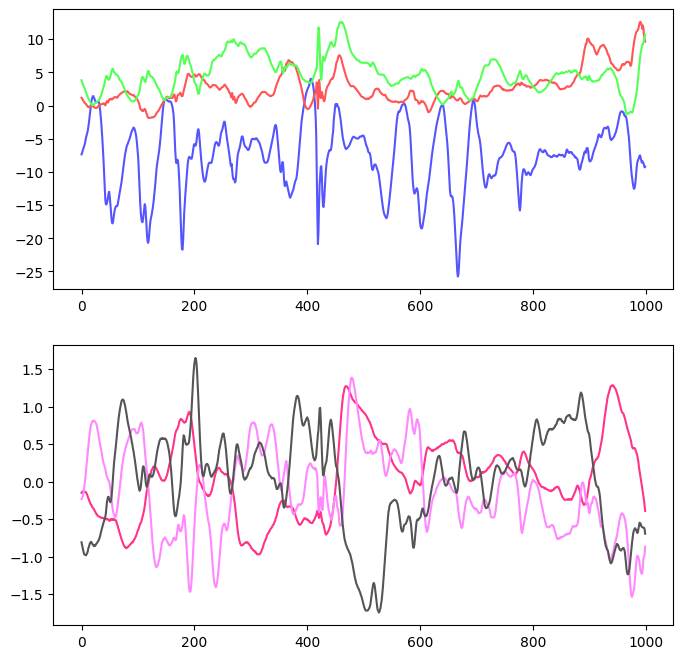

In [54]:
file_name = it_dataset.files[key_pred_idx]
x = it_dataset[key_pred_idx]
imu = x['imu']
text = x['text']

print(file_name)
print(text)

import matplotlib.pyplot as plt
fig = plt.figure(figsize=(8, 8))
fig.add_subplot(2,1,1)
plt.plot(imu[0], label='x', c='#55f')
plt.plot(imu[1], label='y', c='#f55')
plt.plot(imu[2], label='z', c='#5f5')
# plt.axis('off')
fig.add_subplot(2,1,2)
plt.plot(imu[3], label='gyrx', c='#f38')
plt.plot(imu[4], label='gyry', c='#f8f')
plt.plot(imu[5], label='gyrz', c='#555')
# plt.axis('off')

plt.savefig('_.png')
plt.show()

/home/ukita/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/i-t/0087_02
The following text was annotated by an expert after watching the video from the start of task 'Soccer Drills - Inside Trap and Outside Play' up to 14.103992 seconds:  So the criteria here that we're evaluating is first off is as the ball's traveling from the server, you can see the ball's just been passed here, so it's in motion towards the player that's receiving. We're evaluating and looking at his athletic readiness to be able to receive the ball. Here you can see that he's already, as it started to travel, lowered his center of gravity by bending his knees. So that's great. He's on the balls of both of his feet. He's not completely flat-footed, slightly bent over. He's tracking the ball with his eyes. And he's starting to move his left foot into a position where he could catch the ball with the outside of his foot and push the ball in that direction. So from a preparation standpoint, based on the timing of when

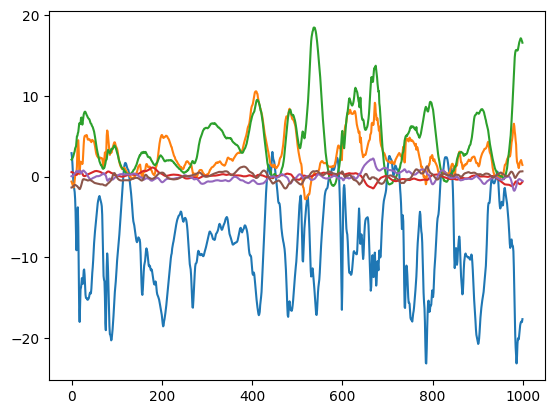

In [15]:
file_name = it_dataset.files[key_pred_idx_2nd]
x = it_dataset[key_pred_idx_2nd]
imu = x['imu']
text = x['text']

print(file_name)
print(text)

import matplotlib.pyplot as plt
plt.plot(imu.T)
plt.show()

In [58]:
im_model.to(device)
im_model.eval()

queries, keys = [], []
for x in im_loader:
    x_imu = x['imu'].to(device)
    x_ = x['mocap'].to(device)
    with torch.no_grad():
        imu_features, _features = im_model(x_imu, x_)
        queries.append(imu_features)
        keys.append(_features)

y_query_modality = torch.cat(queries, dim=0)
y_key_modality   = torch.cat(keys, dim=0)

In [59]:
source_embeddings = y_query_modality
target_embeddings = y_key_modality

n = source_embeddings.shape[0]
target = torch.eye(n).view(-1)
indexes = torch.arange(n).repeat(n, 1).transpose(0, 1).reshape(-1)
s = torch.nn.functional.normalize(source_embeddings, dim=1)
t = torch.nn.functional.normalize(target_embeddings, dim=1)
tt = t.transpose(0, 1)
st = s.transpose(0, 1)
bsz = 1024
batch_num = n // bsz +1
# s -> t
s_t_batch_results = []
for i in range(batch_num):
    start = i * bsz
    end = min((i + 1) * bsz, n)
    query_batch = torch.mm(s[start:end], tt)  # (bsz, m) (m, n) -> (bsz, n)
    s_t_batch_results.append(query_batch.detach().cpu())
s_t_batch_results = torch.cat(s_t_batch_results, dim=0).view(-1)  # (n,n)s

In [60]:
N = int(len(im_dataset))

imu_idx = 14
imu_index_preds = s_t_batch_results.reshape(N, N)[imu_idx]
key_pred_idx = torch.argmax(imu_index_preds).item()
key_pred_idx_2nd = torch.argsort(imu_index_preds)[-2].item()
key_pred_idx, key_pred_idx_2nd

(14, 75)

/home/ukita/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/5s/1793_00_imu.npy


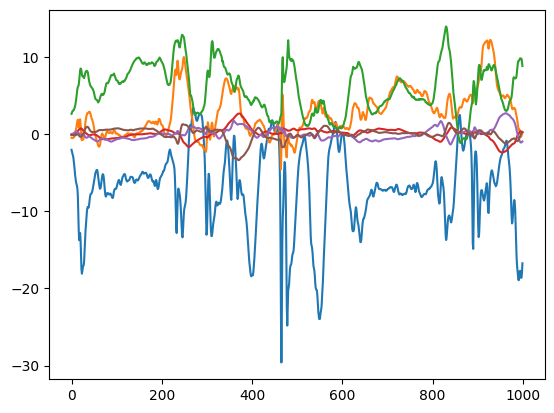

In [66]:
import numpy as np
import matplotlib.pyplot as plt

path = im_dataset.imu_files[75]
print(path)
x = im_dataset[imu_idx]
i = x['imu']
m = x['mocap']
plt.plot(i.T)
plt.show()

In [93]:
import os
import json
import matplotlib.pyplot as plt

dataset_root_dir = '/data4/dataSpace/EGO_EXO4D/'
takes = json.load(open(os.path.join(dataset_root_dir, 'takes.json')))

In [98]:
takes[3285]

{'root_dir': 'takes/uniandes_bouldering_028_33',
 'take_name': 'uniandes_bouldering_028_33',
 'participant_uid': 272,
 'is_dropped': False,
 'objects': [],
 'task_id': 7020,
 'task_name': 'LosAndes_V2_R2',
 'parent_task_id': 7000,
 'parent_task_name': 'Rock Climbing',
 'take_idx': 33,
 'duration_sec': 56.666666666666664,
 'best_exo': 'cam03',
 'task_start_sec': 0.5204,
 'task_end_sec': 56.43334,
 'task_timing_annotation_uid': 'c3213c28-cfa8-41b8-a6a0-d1bf5dfd21c6',
 'is_narrated': False,
 'capture_uid': 'd312be40-2761-4472-9fe3-69c75f2e373e',
 'take_uid': '39b0ea83-e3d5-4dcf-a47c-dc70c6cbe71f',
 'take_timing_uid': '308c8147-5563-4b3c-9821-ec6eed66c5e0',
 'timesync_uid': 'c481d330-aaad-4534-ab38-5c6dac29cb88',
 'timesync_start_idx': 55609,
 'timesync_end_idx': 57309,
 'frame_aligned_videos': {'aria01': {'slam-left': {'cam_id': 'aria01',
    'stream_id': '1201-1',
    'readable_stream_id': 'slam-left',
    'clip_uid': '2f7ceabb-fce3-40b2-a8c2-c83d03b9c31a',
    'is_collage': False,
    '

In [142]:
for file in im_dataset.imu_files:
    i = int(file.split('/')[-1][:4])
    for ii in torch.argsort(s_t_batch_results)[:,-1]:
        j = int(it_dataset.files[ii[-13].item()].split('/')[-1][:4])
        # if takes[i]['parent_task_name'] == 'Rock Climbing':
        # print(i, j)
        if i == j:
            print(file)
            break

IndexError: too many indices for tensor of dimension 1

In [117]:
torch.argsort(s_t_batch_results)[-4].item()

646

In [202]:
takes[3295]['task_name']

'LosAndes_V2_R2'

In [4]:
im_model.to(device)
im_model.eval()

queries, keys = [], []
for x in it_loader:
    x_imu = x['imu'].to(device)
    x_ = ['A woman is bouldering indoors, climbing a colorful artificial rock wall. She wears a white tank top, striped leggings, and climbing shoes, using chalk for grip while reaching for a hold.']
    with torch.no_grad():
        imu_features, text_features = it_model(x_imu, x_)
        keys.append(imu_features)
        queries.append(text_features)

y_query_modality = torch.cat(queries, dim=0)
y_key_modality   = torch.cat(keys, dim=0)

In [5]:
source_embeddings = y_query_modality
target_embeddings = y_key_modality

n = source_embeddings.shape[0]
target = torch.eye(n).view(-1)
indexes = torch.arange(n).repeat(n, 1).transpose(0, 1).reshape(-1)
s = torch.nn.functional.normalize(source_embeddings, dim=1)
t = torch.nn.functional.normalize(target_embeddings, dim=1)
tt = t.transpose(0, 1)
st = s.transpose(0, 1)
bsz = 1024
batch_num = n // bsz +1
# s -> t
s_t_batch_results = []
for i in range(batch_num):
    start = i * bsz
    end = min((i + 1) * bsz, n)
    query_batch = torch.mm(s[start:end], tt)  # (bsz, m) (m, n) -> (bsz, n)
    s_t_batch_results.append(query_batch.detach().cpu())
s_t_batch_results = torch.cat(s_t_batch_results, dim=0).view(-1)  # (n,n)

In [6]:
s_t_batch_results.shape

torch.Size([1000])

In [7]:
# imu_index_preds = s_t_batch_results[imu_idx]
key_pred_idx = torch.argmax(s_t_batch_results).item()
key_pred_idx_2nd = torch.argsort(s_t_batch_results)[-2].item()
key_pred_idx, key_pred_idx_2nd

(515, 512)

/home/ukita/data4/dataSpace/EGO_EXO4D/preprocessed/datasets/i-t/3285_04
Rock Climbing
LosAndes_V2_R2


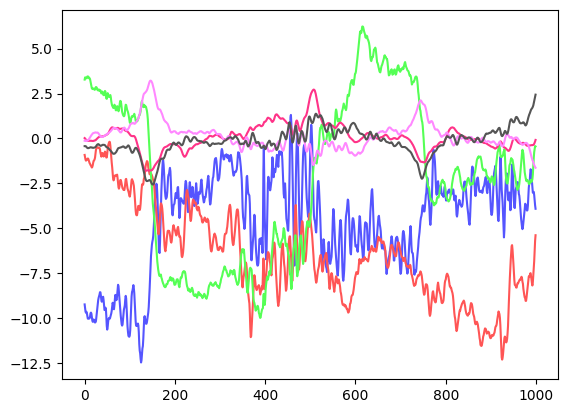

In [20]:
rank = 2
key_pred_idx = torch.argsort(s_t_batch_results)[int(-1*rank)].item()
file_name = it_dataset.files[key_pred_idx]
x = it_dataset[key_pred_idx]
imu = x['imu']
# text = x['text']

print(file_name)
# print(text)
print(takes[int(file_name.split('/')[-1][:4])]['parent_task_name'])
print(takes[int(file_name.split('/')[-1][:4])]['task_name'])

import matplotlib.pyplot as plt
# fig = plt.figure(figsize=(8, 8))
plt.plot(imu[0], label='x', c='#55f')
plt.plot(imu[1], label='y', c='#f55')
plt.plot(imu[2], label='z', c='#5f5')
plt.plot(imu[3], label='gyrx', c='#f38')
plt.plot(imu[4], label='gyry', c='#f8f')
plt.plot(imu[5], label='gyrz', c='#555')
# plt.axis('off')

plt.savefig('_.png')
plt.show()

In [21]:
take_uid = takes[3285]['take_uid']

In [23]:
HZ = 200
IMU_LENGTH = 1000

dataset_root_dir = '/data4/dataSpace/EGO_EXO4D/'
captures = json.load(open(os.path.join(dataset_root_dir, 'captures.json')))
takes = json.load(open(os.path.join(dataset_root_dir, 'takes.json')))
comments_train_json = json.load(open(os.path.join(dataset_root_dir, 'annotations/expert_commentary_train.json')))['annotations']
comments_val_json = json.load(open(os.path.join(dataset_root_dir, 'annotations/expert_commentary_val.json')))['annotations']

try:
    comments_json = comments_train_json[take_uid]
except KeyError:
    try:
        comments_json = comments_val_json[take_uid]
    except KeyError:
        pass

comments = comments_json[0]['commentary_data']
task = comments_json[0]['task_name']

for n, comment in enumerate(comments):
    idx = int(comment['recording'][:-5])
    if idx != 4:
        continue
    
    text = f"The following text was annotated by an expert after watching the video from the start of task '{task}' up to {comment['video_time']} seconds: {comment['text']}"

    imu_end_idx = int(comment['video_time']*HZ)+1
    if imu_end_idx - IMU_LENGTH > 0:
        imu_window = imu[imu_end_idx-IMU_LENGTH:imu_end_idx]
        print(idx, text)

4 The following text was annotated by an expert after watching the video from the start of task 'LosAndes_V2_R2' up to 50.15013 seconds:  Since the climber was able to apply most pressure on the right foot, then the left foot comes off the foot placement and is only used as a guide, meaning for balance, to help the climber shift hips over to the right side.


In [1]:
from torch import nn
class CrossModalContrastiveLearningModule(nn.Module):
    def __init__(self, imu_encoder, another_encoder, another='text'):
        super().__init__()
        self.imu_encoder = imu_encoder
        if another == 'text':
            self.text_encoder = another_encoder
        elif another == 'mocap':
            self.mocap_encoder = another_encoder

    def forward(self, x_imu, x_):
        # x_imu     : (B, 6, window_size=1000) *200Hz
        # x_mocap   : (B, 51, window_size=50)  *10FPS
        # x_text    : (B, 'text any length')
        # *_features: (B, size_embeddings=512)
        imu_features = self.imu_encoder(x_imu)
        text_features = self.text_encoder.get_text_embeddings(x_text)
        return imu_features, text_features

In [6]:
imu_encoder = lambda x: x
text_encoder = lambda x: x
model = CrossModalContrastiveLearningModule(imu_encoder, text_encoder, another='text')
model.mocap_encoder

AttributeError: 'CrossModalContrastiveLearningModule' object has no attribute 'mocap_encoder'

In [1]:
modality = ['imu', 'text']

modality

['text']

In [ ]:
import os
import json
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(16,4))
from tqdm.auto import tqdm
from preprocess.utils import get_imu

dataset_root_dir = '/data4/dataSpace/EGO_EXO4D/'
captures = json.load(open(os.path.join(dataset_root_dir, 'captures.json')))
takes = json.load(open(os.path.join(dataset_root_dir, 'takes.json')))


part = 'right'
hz = 200

path = f'/data4/dataSpace/EGO_EXO4D/preprocessed/imu_{part}_{hz}hz/'
os.makedirs(path, exist_ok=True)

for i, take in tqdm(enumerate(takes), total=len(takes)):
    try:
        timestamps, imus = get_imu(take, imu_part=f'imu-{part}', hz=hz)
        plt.plot(timestamps[:hz], imus[:hz])
        plt.show()
        break
        # np.save(f'{path}{i:04}_{take["take_name"]}_imu.npy', imus)
    except:
        continue